# Neighborhoods of New York City and Toronto
### Capstone Project by Ajay Bhatnagar for IBM Data Science Professional Certificate

## Table of Contents

<table style="width=500px" align="left">
    <tr>
        <td style="text-align:left">1</td> <td style="text-align:left;font-weight:bold"><a href="#item1">Introduction</a></td>
    </tr>
    <tr>
        <td style="text-align:left">2</td> <td style="text-align:left;font-weight:bold"><a href="#item2">Data Acquisition and Wrangling</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">2.1</td> <td style="text-align:left;font-weight:bold">&nbsp;&nbsp;<a href="#item21">Neighborhood Data</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">2.1.1</td> <td style="text-align:left">&nbsp;&nbsp;&nbsp;&nbsp;<a href="#item211">New York City</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">2.1.2</td> <td style="text-align:left">&nbsp;&nbsp;&nbsp;&nbsp;<a href="#item212">Toronto</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">2.2</td> <td style="text-align:left;font-weight:bold">&nbsp;&nbsp;<a href="#item22">Venues Data</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">2.2.1</td> <td style="text-align:left">&nbsp;&nbsp;&nbsp;&nbsp;<a href="#item221">New York City</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">2.2.2</td> <td style="text-align:left">&nbsp;&nbsp;&nbsp;&nbsp;<a href="#item222">Toronto</a></td>
    </tr> 
    <tr>
        <td style="text-align:left">3</td> <td style="text-align:left;font-weight:bold"><a href="#item3">Methodology</a></td>
    </tr>
    <tr>
        <td style="text-align:left">4</td> <td style="text-align:left;font-weight:bold"><a href="#item4">Exploratory Data Analysis</a></td>
    </tr>
    <tr>
        <td style="text-align:left">4.1</td> <td style="text-align:left">&nbsp;&nbsp;<a href="#item41">Visualize New York City and Toronto Neighborhoods</a></td>
    </tr>
    <tr>
        <td style="text-align:left">4.2</td> <td style="text-align:left">&nbsp;&nbsp;<a href="#item42">Explore New York City and Toronto Neighborhoods</a></td>
    </tr>
    <tr>
        <td style="text-align:left">5</td> <td style="text-align:left;font-weight:bold"><a href="#item5">Cluster New York City and Toronto Neighborhoods</a></td>
    </tr>
    <tr>
        <td style="text-align:left">6</td> <td style="text-align:left;font-weight:bold"><a href="#item6">Results and Discussion</a></td>
    </tr>
    <tr>
        <td style="text-align:left">7</td> <td style="text-align:left;font-weight:bold"><a href="#item7">Conclusion</a></td>
    </tr>
</table>


<br><br><br><a id='item1'></a>

## 1 Introduction

**New York City** and **Toronto** are both very densely populated and diverse cities which are also the financial capitals of their respective countries. New York City is located in the state of New York of the United States of America while Toronto is located in the Ontario province of Canada. It would be interesting to compare and contrast the neighborhoods of New York City and Toronto.<br><br>
Specifically, we would like to **find out answers to questions such as**:
<br>&nbsp;&nbsp;What are the most common venue categories in each city?
<br>&nbsp;&nbsp;What venue categories are most widespread in each city?
<br>&nbsp;&nbsp;How many neighborhoods of these two cities are similar to each other?
<br>&nbsp;&nbsp;How many neighborhoods of these two cities are quite unique to themselves?
<br>&nbsp;&nbsp;Are these two cities very similar to each other or very different?
<br><br>
**People who are considering moving** from either New York City to Toronto or vice-versa will be very interested in this comparison to be able to find neighborhoods in the city they want to move to, similar to where they are living in their current city or aspiring to get to in the other city.
This type of comparison would also be of interest to **planners and officials of these cities and their neighborhoods** to be able to look at data trends and decide which types of businesses to promote based on what appears to be working in the similar neighborhoods of the other city.


<br><br><br><a id='item2'></a>

## 2 Data Acquisition and Wrangling

#### Install and Import all required libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#!pip install geocoder
import geocoder # import geocoder

import json # library to handle JSON files

#!pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

# import sklearn metrics that help us select optimal number of clusters to be used for k-means
from sklearn.metrics import silhouette_score, davies_bouldin_score,v_measure_score

#!pip install folium
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


<br><br><br><a id='item21'></a>

## 2.1 Neighborhoods Data

<br><br><br><a id='item211'></a>

## 2.1.1 New York City Neighborhoods Data

In [2]:
with open('newyork_data.json') as json_data:
    nyc_data = json.load(json_data)

In [3]:
#nyc_data

In [4]:
nyc_neighborhoods_data = nyc_data['features']

In [5]:
nyc_neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

#### Tranform the data into a *pandas* dataframe

In [6]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
nyc_neighborhoods = pd.DataFrame(columns=column_names)

for data in nyc_neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    nyc_neighborhoods = nyc_neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [7]:
nyc_neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [8]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(nyc_neighborhoods['Borough'].unique()),
        nyc_neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


Check if there are any neighborhoods with same names

In [9]:
nycnvc = nyc_neighborhoods['Neighborhood'].value_counts()
nycnvc[nycnvc > 1]

Murray Hill    2
Chelsea        2
Bay Terrace    2
Sunnyside      2
Name: Neighborhood, dtype: int64

Let's check one neighborhood that occurs twice - Chelsea

In [10]:
nyc_neighborhoods[nyc_neighborhoods['Neighborhood'] == 'Chelsea']

,Borough,Neighborhood,Latitude,Longitude
116,Manhattan,Chelsea,40.744035,-74.003116
244,Staten Island,Chelsea,40.594726,-74.189560


It means that Chelsea exists in Manhattan as well as Staten Island Boroughs; to make these neighborhoods appear unique, let us append the Borough name to the Neighborhood for these cases

In [11]:
for i in range(nyc_neighborhoods.shape[0]):
    nyc_n = nyc_neighborhoods.loc[i, 'Neighborhood']
    if nyc_neighborhoods[nyc_neighborhoods['Neighborhood'] == nyc_n].shape[0] > 1:
        n_ind = nyc_neighborhoods[nyc_neighborhoods['Neighborhood'] == nyc_n].index.tolist()
        for j in n_ind:
            nyc_b = nyc_neighborhoods.loc[j, 'Borough']
            nyc_neighborhoods.loc[j, 'Neighborhood'] = nyc_n + ', ' + nyc_b

In [12]:
nyc_neighborhoods[nyc_neighborhoods['Neighborhood'].str.startswith('Chelsea')]

,Borough,Neighborhood,Latitude,Longitude
116,Manhattan,"Chelsea, Manhattan",40.744035,-74.003116
244,Staten Island,"Chelsea, Staten Island",40.594726,-74.189560


Finally, lets prefix all NYC Neighborhoods with "NYC_"

In [13]:
nyc_neighborhoods['Neighborhood'] = 'NYC_' + nyc_neighborhoods['Neighborhood'].astype(str)
print(nyc_neighborhoods.shape)
nyc_neighborhoods.head()

(306, 4)


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,NYC_Wakefield,40.894705,-73.847201
1,Bronx,NYC_Co-op City,40.874294,-73.829939
2,Bronx,NYC_Eastchester,40.887556,-73.827806
3,Bronx,NYC_Fieldston,40.895437,-73.905643
4,Bronx,NYC_Riverdale,40.890834,-73.912585


In [14]:
nyc_neighborhoods.shape

(306, 4)

In [15]:
nyc_neighborhoods.to_csv("newyork_neighborhoods.csv")

<br><br><br><a id='item212'></a>

## 2.1.2 Toronto Neighborhoods Data

#### Webscrape the neighborhood data

In [16]:
# use pandas to find all tables in html page whose URL was provided
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
dfs = pd.read_html(url)

# check how many tables were found by pandas in html page
print(len(dfs))

3


In [17]:
# check the first table found by pandas in html page if it is the right table that we need
dfs[0].head()

,Postal Code,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


#### Create dataframe with webscraped neighborhood data and required column names

In [18]:
# this is the right table that we need
tor_neighborhoods = dfs[0]
# update the column names to match requirement 
tor_neighborhoods.columns = ['PostalCode', 'Borough', 'Neighborhood']
tor_neighborhoods.head()

,PostalCode,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"


In [19]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(tor_neighborhoods['Borough'].unique()),
        tor_neighborhoods.shape[0]
    )
)

The dataframe has 11 boroughs and 180 neighborhoods.


In [20]:
# check original rows and columns in dataframe
tor_neighborhoods.shape

(180, 3)

#### Drop rows with Borough = 'Not assigned'

In [21]:
# check of there are any rows with Borough == 'Not assigned'
df = tor_neighborhoods.Borough =='Not assigned'
df.value_counts()

False    103
True      77
Name: Borough, dtype: int64

In [22]:
# drop all rows with Borough='Not assigned'
tor_neighborhoods = tor_neighborhoods[tor_neighborhoods.Borough!='Not assigned']
# check rows in dataframe after dropping all rows with Borough='Not assigned'
tor_neighborhoods.shape

(103, 3)

In [23]:
tor_neighborhoods.head()

,PostalCode,Borough,Neighborhood
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,"Regent Park, Harbourfront"
5,M6A,North York,"Lawrence Manor, Lawrence Heights"
6,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


#### Update Neighborhood with Borough for rows with Neighborhood = 'Not assigned'

In [24]:
# check of there are any rows with Neighborhood == 'Not assigned'
df = tor_neighborhoods.Neighborhood =='Not assigned'
df.value_counts()

False    103
Name: Neighborhood, dtype: int64

In [25]:
# just to be sure that in future if there are any rows with Neighborhood == 'Not assigned'; update Neighborhood = Borough
tor_neighborhoods.Neighborhood.replace('Not assigned', tor_neighborhoods.Borough, inplace=True)
tor_neighborhoods.shape

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\generic.py:6746: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


(103, 3)

#### Clean up dataframe

In [26]:
# clean up dataframe by resetting index to be based on final rows remaining
tor_neighborhoods.reset_index(inplace=True, drop=True)

In [27]:
tor_neighborhoods.head()

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government"


#### Check if there are any neighborhoods with same names

In [28]:
tornvc = tor_neighborhoods['Neighborhood'].value_counts()
tornvc[tornvc > 1]

Downsview    4
Don Mills    2
Name: Neighborhood, dtype: int64

Let's check one neighborhood that occurs twice - Downsview

In [29]:
tor_neighborhoods[tor_neighborhoods['Neighborhood'] == 'Downsview']

,PostalCode,Borough,Neighborhood
40,M3K,North York,Downsview
46,M3L,North York,Downsview
53,M3M,North York,Downsview
60,M3N,North York,Downsview


It means that Downsview exists in North York Borough with multiple PostalCodes; to make these neighborhoods appear unique, let us append the PostalCode to the Neighborhood for these cases

In [30]:
for i in range(tor_neighborhoods.shape[0]):
    tor_n = tor_neighborhoods.loc[i, 'Neighborhood']
    if tor_neighborhoods[tor_neighborhoods['Neighborhood'] == tor_n].shape[0] > 1:
        n_ind = tor_neighborhoods[tor_neighborhoods['Neighborhood'] == tor_n].index.tolist()
        for j in n_ind:
            tor_b = tor_neighborhoods.loc[j, 'PostalCode']
            tor_neighborhoods.loc[j, 'Neighborhood'] = tor_n + ', ' + tor_b

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [31]:
tor_neighborhoods[tor_neighborhoods['Neighborhood'].str.startswith('Downsview')]

,PostalCode,Borough,Neighborhood
40,M3K,North York,"Downsview, M3K"
46,M3L,North York,"Downsview, M3L"
53,M3M,North York,"Downsview, M3M"
60,M3N,North York,"Downsview, M3N"


In [32]:
# final dataframe shape
tor_neighborhoods.shape

(103, 3)

#### Use geocoder with ArcGIS provider to find latitude and longitude for each neighborhood (Note: Google doesn't work) 

In [33]:
for i in range(len(tor_neighborhoods)):
    # print('{}, Toronto, Ontario'.format(tor_neighborhoods.loc[i, 'PostalCode']))
    g = geocoder.arcgis('{}, Toronto, Ontario'.format(tor_neighborhoods.loc[i, 'PostalCode']))
    tor_neighborhoods.loc[i, 'Latitude'] = g.latlng[0]
    tor_neighborhoods.loc[i, 'Longitude'] = g.latlng[1]
    
tor_neighborhoods.head()

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:845: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.752935,-79.335641
1,M4A,North York,Victoria Village,43.728102,-79.311890
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.650964,-79.353041
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.723265,-79.451211
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.661790,-79.389390


In [34]:
tor_neighborhoods.drop(['PostalCode'], axis=1, inplace=True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


Finally, lets prefix all Toronto Neighborhoods with "YYZ_". BTW - YYZ is the airport code for Toronto International.

In [35]:
tor_neighborhoods['Neighborhood'] = 'YYZ_' + tor_neighborhoods['Neighborhood'].astype(str)
print(tor_neighborhoods.shape)
tor_neighborhoods.head()

(103, 4)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Borough,Neighborhood,Latitude,Longitude
0,North York,YYZ_Parkwoods,43.752935,-79.335641
1,North York,YYZ_Victoria Village,43.728102,-79.311890
2,Downtown Toronto,"YYZ_Regent Park, Harbourfront",43.650964,-79.353041
3,North York,"YYZ_Lawrence Manor, Lawrence Heights",43.723265,-79.451211
4,Downtown Toronto,"YYZ_Queen's Park, Ontario Provincial Government",43.661790,-79.389390


In [36]:
tor_neighborhoods.shape

(103, 4)

In [37]:
tor_neighborhoods.to_csv("toronto_neighborhoods.csv")

<br><br><br><a id='item22'></a>

## 2.2 Venues Data

#### Define Foursquare Credentials and Version

In [38]:
CLIENT_ID = 'VQJEZ35OHJD0LEV0LCOS0CWOY3OAD42ISHZG5CV0LMJZ2T3G' # your Foursquare ID
CLIENT_SECRET = 'II0ZBJO2VGQESXIS1P2PH3L1BI3TLJHXV2EOU05W4R0BJU4N' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: VQJEZ35OHJD0LEV0LCOS0CWOY3OAD42ISHZG5CV0LMJZ2T3G
CLIENT_SECRET:II0ZBJO2VGQESXIS1P2PH3L1BI3TLJHXV2EOU05W4R0BJU4N


In [39]:
# create the API request URL
url = 'https://api.foursquare.com/v2/venues/categories?&client_id={}&client_secret={}&v={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION)
            
# make the GET request
response = requests.get(url).json()
with open('data.json', 'w', encoding='utf-8') as f:
    json.dump(response, f, ensure_ascii=False, indent=4)


In [40]:
# print the number of first level categories

len(response['response']['categories'])

10

In [41]:
# print the names of the first level categories

for i in range(len(response['response']['categories'])):
    print(response['response']['categories'][i]['name'])

Arts & Entertainment
College & University
Event
Food
Nightlife Spot
Outdoors & Recreation
Professional & Other Places
Residence
Shop & Service
Travel & Transport


In [42]:
df_FSQ_Categories = pd.DataFrame(columns=['Level1','Level2 Count'])
for i in range(len(response['response']['categories'])):
    df_FSQ_Categories = df_FSQ_Categories.append({'Level1': response['response']['categories'][i]['name'],
                                                  'Level2 Count': len(response['response']['categories'][i]['categories'])}, ignore_index=True)
    #level2_cat += len(response['response']['categories'][i]['categories'])
    #print(response['response']['categories'][i]['name'], len(response['response']['categories'][i]['categories']))

df_FSQ_Categories

,Level1,Level2 Count
0,Arts & Entertainment,36
1,College & University,23
2,Event,12
3,Food,92
4,Nightlife Spot,7
5,Outdoors & Recreation,62
6,Professional & Other Places,43
7,Residence,5
8,Shop & Service,145
9,Travel & Transport,34


In [43]:
# print number of first, second & third level categories

level1_cat = len(response['response']['categories'])
level2_cat = 0
level3_cat = 0
for i in range(len(response['response']['categories'])):
    level2_cat += len(response['response']['categories'][i]['categories'])
    #print(i, len(response['response']['categories'][i]['categories']))
    for j in range(len(response['response']['categories'][i]['categories'])):
                 level3_cat += len(response['response']['categories'][i]['categories'][j]['categories'])
                 #print(i, j, len(response['response']['categories'][i]['categories'][j]['categories']))

print('Level 1 Categories:', level1_cat)
print('Level 2 Categories:', level2_cat)
print('Level 3 Categories:', level3_cat)

Level 1 Categories: 10
Level 2 Categories: 459
Level 3 Categories: 370


#### Function getNearbyVenues

In [44]:
# Let's create a function to search all venues around all neighborhoods' latitude and longitude coordinates
# we will limit venues to 100 within a 500 meter radius

def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
        print('#', end='')
        
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]["venues"]
                
        # return only relevant information for each nearby venue   
        venues_list.append([(name, lat, lng, v['name'], v['location']['lat'], 
                             v['location']['lng'], v['categories'][0]['name']) 
                            for v in results if len(v['categories']) > 0])
        
    print(' Done!')
    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

<br><br><br><a id='item221'></a>

## 2.2.1 New York City Venues Data

#### Get New York City Venues

In [45]:
# run the above function on each neighborhood and create a new dataframe called nyc_venues and check its size
nyc_venues = getNearbyVenues(names=nyc_neighborhoods['Neighborhood'],
                                   latitudes=nyc_neighborhoods['Latitude'],
                                   longitudes=nyc_neighborhoods['Longitude']
                                  )
nyc_venues.shape

################################################################################################################################################################################################################################################################################################################## Done!


(26504, 7)

#### Removing Venues of Categories that are not of relevance to the clustering analysis

In [46]:
# Removing records where venue category is "Building"
nyc_venues = nyc_venues[~nyc_venues['Venue Category'].isin(['Building'])]
print(nyc_venues.shape)
nyc_venues.head()

(25659, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,NYC_Wakefield,40.894705,-73.847201,Shell,40.894187,-73.845862,Gas Station
1,NYC_Wakefield,40.894705,-73.847201,Pitman Deli,40.896744,-73.844398,Food
2,NYC_Wakefield,40.894705,-73.847201,Julio C Barber Shop 2,40.892648,-73.855725,Salon / Barbershop
3,NYC_Wakefield,40.894705,-73.847201,Public School 87,40.895487,-73.846004,School
4,NYC_Wakefield,40.894705,-73.847201,Lollipops Gelato,40.894123,-73.845892,Dessert Shop


#### Let's validate if we got venues for all New York City neighborhoods (the 2 cells below should result in same number)

In [47]:
nyc_neighborhoods.shape[0]

306

In [48]:
nyc_venues['Neighborhood'].unique().shape[0]

306

#### Let's save the Venues in a file

In [49]:
nyc_venues.to_csv("nyc_venues.csv")

<br><br><br><a id='item222'></a>

## 2.2.1 Toronto Venues Data

#### Get Toronto Venues

In [50]:
# run the above function on each neighborhood and create a new dataframe called toronto_venues and check its size
toronto_venues = getNearbyVenues(names=tor_neighborhoods['Neighborhood'],
                                   latitudes=tor_neighborhoods['Latitude'],
                                   longitudes=tor_neighborhoods['Longitude']
                                  )
toronto_venues.shape

####################################################################################################### Done!


(8761, 7)

#### Removing Venues of Categories that are not of relevance to the clustering analysis

In [51]:
# Removing records where venue category is "Building"
toronto_venues = toronto_venues[~toronto_venues['Venue Category'].isin(['Building'])]
print(toronto_venues.shape)
toronto_venues.head()

(8500, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,YYZ_Parkwoods,43.752935,-79.335641,Church Of Our Saviour,43.751496,-79.337078,Church
1,YYZ_Parkwoods,43.752935,-79.335641,Three Valleys Public School,43.750595,-79.337341,School
2,YYZ_Parkwoods,43.752935,-79.335641,GTA Restoration | Emergency Water Damage Plumb...,43.753567,-79.351308,Construction & Landscaping
3,YYZ_Parkwoods,43.752935,-79.335641,Mo's Ride,43.755123,-79.334583,General Travel
4,YYZ_Parkwoods,43.752935,-79.335641,Bruno's Fine Foods,43.745608,-79.336772,Grocery Store


#### Let's validate if we got venues for all Toronto neighborhoods (the 2 cells below should result in same number)

In [52]:
tor_neighborhoods.shape[0]

103

In [53]:
toronto_venues['Neighborhood'].unique().shape[0]

103

#### Lets save the Venues in a file

In [54]:
toronto_venues.to_csv("toronto_venues.csv")

<br><br><br><a id='item3'></a>

## 3 Methodology

The objective of this project is to compare and contrast the neighborhoods of New York City and Toronto.

In previous step we have collected all the required data: <br>
<br>**Neighborhood Data** for New York & Toronto using JSON file, web scraping a wiki page & latitude/longitude coordinates using geocoder with ArcGIS provider.
<br>**Venues Data** for New York City and Toronto using Foursquare API and removing venues of any categories not relevant to our analysis.
<br>Details about **Venue Categories** used by Foursquare to categorize Venues - these categories will be used as the features for our clustering analysis.

In the next step, we will begin our analysis of the neighborhoods of New York City and Toronto by first **visualizing the neighborhoods of each city**, exploring venues of each city by finding out the **total number of distinct venue categories** in each city, **most common and most widespread venue categories** across the neighborhoods of each city. We will then **prepare the data needed for the clustering algorithm** and we will also generate the **top 10 most common categories in each neighborhood**.

In the final step we will carry out the clustering of all neighborhoods of both cities by first combining all relevant datasets for both cities into one. In order to use **K-Means Clustering**, we will generate a dataset of all features (all venue categories) to do the clustering on and we will use the **Elbow Method** as well as the **Silhouette Score Method** to determine the **optimal number of clusters** for our dataset. We will then run the clustering on the optimal number of clusters. Finally, we will then do **analysis of each cluster to name and explain them** so that they can be used appropriately in our Results and Discussion section to meet the project objective.

<br><br><br><a id='item4'></a>

## 4 Exploratory Data Analysis

In this step, we will begin our analysis of the neighborhoods of New York City and Toronto by first **visualizing the neighborhoods of each city**, exploring venues of each city by finding out the **total number of distinct venue categories** in each city, **most common and most widespread venue categories** across the neighborhoods of each city. We will then **prepare the data needed for the clustering algorithm** and we will also generate the **top 10 most common categories in each neighborhood**.

<br><br><br><a id='item41'></a>

## 4.1 Visualize New York City and Toronto Neighborhoods

#### Use geolocator to find latitude and longitude of New York City

In [55]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
nyc_latitude = location.latitude
nyc_longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(nyc_latitude, nyc_longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


#### Create map of New York City with the neighborhoods plotted on it

In [56]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[nyc_latitude, nyc_longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(nyc_neighborhoods['Latitude'], nyc_neighborhoods['Longitude'], nyc_neighborhoods['Borough'], nyc_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

In [57]:
map_newyork.save("new_york_city_neighborhoods.html")

#### Use geolocator to find latitude and longitude of Toronto

In [58]:
address = 'Toronto, Ontario'

tor_geolocator = Nominatim(user_agent="toronto_explorer")
tor_location = tor_geolocator.geocode(address)
tor_latitude = tor_location.latitude
tor_longitude = tor_location.longitude
print('The geographical coordinates of Toronto are {}, {}.'.format(tor_latitude, tor_longitude))

The geographical coordinates of Toronto are 43.6534817, -79.3839347.


#### Create map of Toronto with the neighborhoods plotted on it

In [59]:
# create map of Toronto using latitude and longitude values
map_toronto = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(tor_neighborhoods['Latitude'], tor_neighborhoods['Longitude'], tor_neighborhoods['Borough'], tor_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_toronto)  
    
map_toronto

In [60]:
map_toronto.save("toronto_neighborhoods.html")

<br><br><br><a id='item42'></a>

## 4.2 Explore New York City and Toronto Neighborhoods

#### Explore New York City Neighborhoods

In [61]:
# Let's check how many venues were returned for each neighborhood
nyc_venues.groupby('Neighborhood').size()

Neighborhood
NYC_Allerton                      92
NYC_Annadale                      80
NYC_Arden Heights                 77
NYC_Arlington                     84
NYC_Arrochar                      89
NYC_Arverne                       93
NYC_Astoria                       77
NYC_Astoria Heights               76
NYC_Auburndale                    63
NYC_Bath Beach                    90
NYC_Battery Park City             93
NYC_Bay Ridge                     88
NYC_Bay Terrace, Queens           94
NYC_Bay Terrace, Staten Island    79
NYC_Baychester                    89
NYC_Bayside                       87
NYC_Bayswater                     84
NYC_Bedford Park                  80
NYC_Bedford Stuyvesant            91
NYC_Beechhurst                    98
NYC_Bellaire                      82
NYC_Belle Harbor                  88
NYC_Bellerose                     87
NYC_Belmont                       61
NYC_Bensonhurst                   87
NYC_Bergen Beach                  83
NYC_Blissville           

#### Let's find out how many unique categories can be curated from all the returned venues

In [62]:
print('There are {} unique categories.'.format(len(nyc_venues['Venue Category'].unique())))

There are 578 unique categories.


#### Most commmon venue categories in NYC

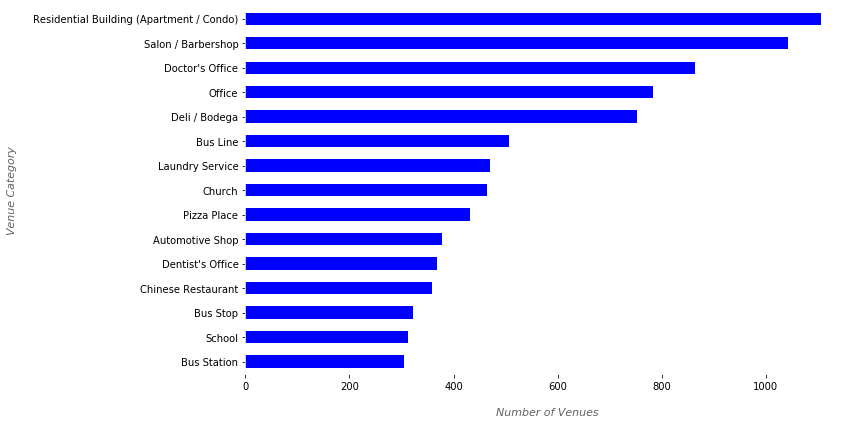

In [63]:
fig, ax = plt.subplots(figsize=(12,6), facecolor='#ffffff')
nyc_top_vc = nyc_venues['Venue Category'].value_counts(normalize=False)
ax = nyc_top_vc.head(15).plot(kind='barh', color='blue');
ax.invert_yaxis()
#plot_conf(ax, xlbl='Number of venues', ylbl='Venue category', t='')
ax.spines['bottom'].set_color('#ffffff')
ax.spines['top'].set_color('#ffffff') 
ax.spines['right'].set_color('#ffffff')
ax.spines['left'].set_color('#ffffff')
ax.set_title('', fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold');
ax.set_xlabel('Number of Venues', labelpad=16, fontsize=11, color='#616161', fontstyle='italic');
ax.set_ylabel('Venue Category', color='#616161', labelpad=16, fontsize=11, fontstyle='italic');
plt.tight_layout()
fig.savefig('most-common-ven-nyc.png', dpi=300)

#### Analyze Each Neighborhood

In [64]:
# one hot encoding
nyc_onehot = pd.get_dummies(nyc_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
nyc_onehot['Neighborhood'] = nyc_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [nyc_onehot.columns[-1]] + list(nyc_onehot.columns[:-1])
nyc_onehot = nyc_onehot[fixed_columns]

nyc_onehot.head()

,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Terminal,Airport Tram,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Claim,Baggage Locker,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Bathing Area,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Football Field,College Gym,College Lab,College Library,College Math Building,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Amenity,Corporate Cafeteria,Cosmetics Shop,Costume Shop,Country Dance Club,Courthouse,Coworking Space,Credit Union,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Driving School,Drugstore,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Emergency Room,Empanada Restaurant,Entertainment Service,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fish & Chips Shop,Fish Market,Fishing Spot,Fishing Store,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Hindu Temple,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hospital Ward,Host

In [65]:
# let us examine the size of this dataframe
nyc_onehot.shape

(25659, 579)

#### Most widespread venue categories in NYC

306 neighborhoods in NYC


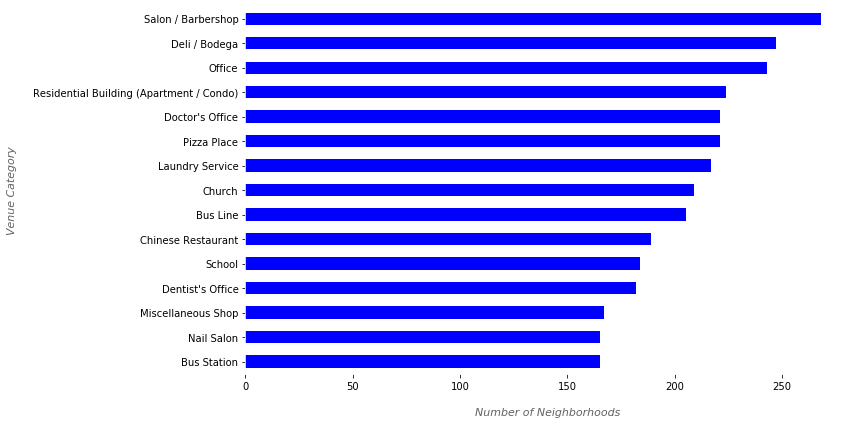

In [66]:
fig, ax = plt.subplots(figsize=(12,6), facecolor='#ffffff')
nyc_g = nyc_onehot.groupby('Neighborhood').max().reset_index()
nyc_p = nyc_g.drop('Neighborhood', axis=1).sum().sort_values(ascending=False)
print("{} neighborhoods in NYC".format(nyc_g.shape[0]))
ax = nyc_p.head(15).plot(kind='barh', color='blue');
ax.invert_yaxis()
#plot_conf(ax, xlbl='Number of neighborhoods', ylbl='Venue category', t='')
ax.spines['bottom'].set_color('#ffffff')
ax.spines['top'].set_color('#ffffff') 
ax.spines['right'].set_color('#ffffff')
ax.spines['left'].set_color('#ffffff')
ax.set_title('', fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold');
ax.set_xlabel('Number of Neighborhoods', labelpad=16, fontsize=11, color='#616161', fontstyle='italic');
ax.set_ylabel('Venue Category', color='#616161', labelpad=16, fontsize=11, fontstyle='italic');
plt.tight_layout()
fig.savefig('most-common2-ven-nyc.png', dpi=300)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [67]:
nyc_grouped = nyc_onehot.groupby('Neighborhood').mean().reset_index()
nyc_grouped

,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Terminal,Airport Tram,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Claim,Baggage Locker,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Bathing Area,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Football Field,College Gym,College Lab,College Library,College Math Building,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Amenity,Corporate Cafeteria,Cosmetics Shop,Costume Shop,Country Dance Club,Courthouse,Coworking Space,Credit Union,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Driving School,Drugstore,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Emergency Room,Empanada Restaurant,Entertainment Service,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fish & Chips Shop,Fish Market,Fishing Spot,Fishing Store,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Hindu Temple,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hospital Ward,Host

In [68]:
# Confirm the new size
nyc_grouped.shape

(306, 579)

#### Create new dataframe with Top 10 most common venue categories for each neighborhood

In [69]:
# first create function to sort categories in desc order
def return_most_common_categories(row, num_top_cat):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_cat]

In [70]:
# Now let's create the new dataframe and display the top 10 categories for each neighborhood
num_top_cat = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top categories
columns = ['Neighborhood']
for ind in np.arange(num_top_cat):
    try:
        columns.append('{}{} Most Common Category'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Category'.format(ind+1))

# create a new dataframe
nyc_neighborhoods_categories_sorted = pd.DataFrame(columns=columns)
nyc_neighborhoods_categories_sorted['Neighborhood'] = nyc_grouped['Neighborhood']

for ind in np.arange(nyc_grouped.shape[0]):
    nyc_neighborhoods_categories_sorted.iloc[ind, 1:] = return_most_common_categories(nyc_grouped.iloc[ind, :], num_top_cat)

nyc_neighborhoods_categories_sorted.head()

,Neighborhood,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
0,NYC_Allerton,Salon / Barbershop,Laundry Service,Bus Line,Car Wash,Non-Profit,Gas Station,Automotive Shop,Pharmacy,Pizza Place,Deli / Bodega
1,NYC_Annadale,Salon / Barbershop,Pizza Place,Tattoo Parlor,Nail Salon,American Restaurant,Restaurant,Bar,Doctor's Office,General Entertainment,Pet Store
2,NYC_Arden Heights,Pool,Professional & Other Places,Church,Dentist's Office,Doctor's Office,Moving Target,Salon / Barbershop,Medical Center,Cocktail Bar,Mexican Restaurant
3,NYC_Arlington,Church,Bus Stop,Professional & Other Places,Residential Building (Apartment / Condo),Hardware Store,Office,Salon / Barbershop,Laundry Service,Playground,Deli / Bodega
4,NYC_Arrochar,Deli / Bodega,Bus Stop,Bus Line,Food Truck,Doctor's Office,Pizza Place,Medical Center,Event Space,Office,Nail Salon


In [71]:
nyc_neighborhoods_categories_sorted.shape

(306, 11)

#### Explore the Toronto Neighborhoods

In [72]:
# Let's check how many venues were returned for each neighborhood
toronto_venues.groupby('Neighborhood').size()

Neighborhood
YYZ_Agincourt                                                                                                                                 65
YYZ_Alderwood, Long Branch                                                                                                                    89
YYZ_Bathurst Manor, Wilson Heights, Downsview North                                                                                           84
YYZ_Bayview Village                                                                                                                           91
YYZ_Bedford Park, Lawrence Manor East                                                                                                         86
YYZ_Berczy Park                                                                                                                               76
YYZ_Birch Cliff, Cliffside West                                                                                      

#### Let's find out how many unique categories can be curated from all the returned venues

In [73]:
print('There are {} unique categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 501 unique categories.


#### Most common venue categories in Toronto

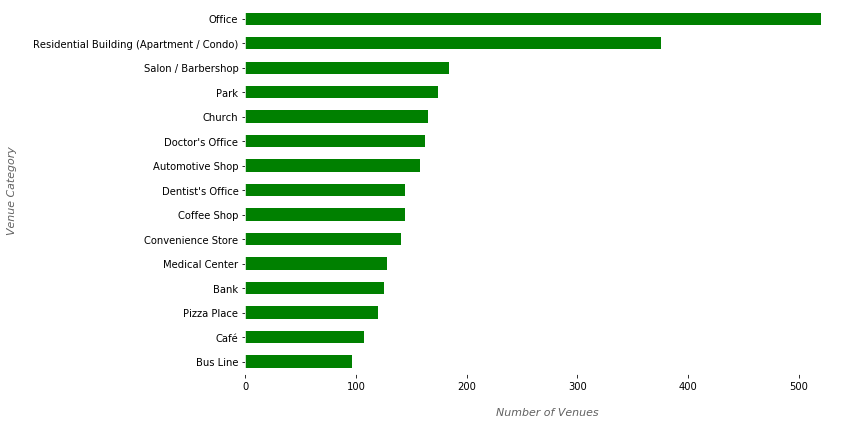

In [74]:
fig, ax = plt.subplots(figsize=(12,6), facecolor='#ffffff')
tor_top_vc = toronto_venues['Venue Category'].value_counts(normalize=False)
ax = tor_top_vc.head(15).plot(kind='barh', color='green')
ax.invert_yaxis()
ax.spines['bottom'].set_color('#ffffff')
ax.spines['top'].set_color('#ffffff') 
ax.spines['right'].set_color('#ffffff')
ax.spines['left'].set_color('#ffffff')
ax.set_title('', fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold')
ax.set_xlabel('Number of Venues', labelpad=16, fontsize=11, color='#616161', fontstyle='italic')
ax.set_ylabel('Venue Category', color='#616161', labelpad=16, fontsize=11, fontstyle='italic')
plt.tight_layout()
fig.savefig('most-common-ven-tor.png', dpi=300)

#### Analyze Each Neighborhood

In [75]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Auditorium,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Capitol Building,Car Wash,Caribbean Restaurant,Casino,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus School,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Engineering Building,College Football Field,College Gym,College History Building,College Hockey Rink,College Lab,College Library,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Cafeteria,Corporate Coffee Shop,Cosmetics Shop,Costume Shop,Courthouse,Coworking Space,Credit Union,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Driving School,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Festival,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Frame Store,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Hindu Temple,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Internet Cafe,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Jewish Restaurant,Juice Bar,Ka

In [76]:
# let us examine the size of this dataframe
toronto_onehot.shape

(8500, 502)

#### Most widespread venue categories in Toronto

103 Neighborhoods in Toronto


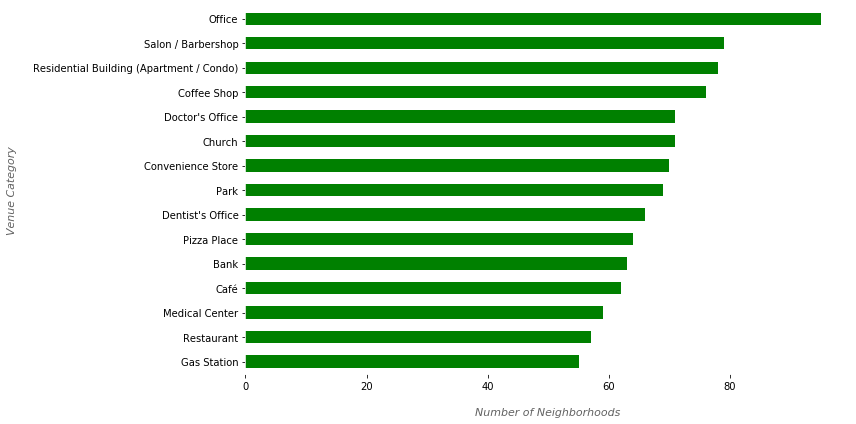

In [77]:
fig, ax = plt.subplots(figsize=(12,6), facecolor='#ffffff')
tor_g = toronto_onehot.groupby('Neighborhood').max().reset_index()
tor_p = tor_g.drop('Neighborhood', axis=1).sum().sort_values(ascending=False)
print("{} Neighborhoods in Toronto".format(tor_g.shape[0]))
ax = tor_p.head(15).plot(kind='barh', color='green')
ax.invert_yaxis()
ax.spines['bottom'].set_color('#ffffff')
ax.spines['top'].set_color('#ffffff') 
ax.spines['right'].set_color('#ffffff')
ax.spines['left'].set_color('#ffffff')
ax.set_title('', fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold')
ax.set_xlabel('Number of Neighborhoods', labelpad=16, fontsize=11, color='#616161', fontstyle='italic')
ax.set_ylabel('Venue Category', color='#616161', labelpad=16, fontsize=11, fontstyle='italic')
plt.tight_layout()
fig.savefig('most-common2-ven-tor.png', dpi=300)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [78]:
toronto_grouped = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grouped

,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Auditorium,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Capitol Building,Car Wash,Caribbean Restaurant,Casino,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus School,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Engineering Building,College Football Field,College Gym,College History Building,College Hockey Rink,College Lab,College Library,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Cafeteria,Corporate Coffee Shop,Cosmetics Shop,Costume Shop,Courthouse,Coworking Space,Credit Union,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Driving School,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Festival,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Frame Store,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Hindu Temple,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Internet Cafe,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Jewish Restaurant,Juice Bar,Ka

In [79]:
# Confirm the new size
toronto_grouped.shape

(103, 502)

#### Create new dataframe with Top 10 most common venue categories for each neighborhood

In [80]:
# Now let's create the new dataframe and display the top 10 venues for each neighborhood
num_top_cat = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_cat):
    try:
        columns.append('{}{} Most Common Category'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Category'.format(ind+1))

# create a new dataframe
toronto_neighborhoods_categories_sorted = pd.DataFrame(columns=columns)
toronto_neighborhoods_categories_sorted['Neighborhood'] = toronto_grouped['Neighborhood']

for ind in np.arange(toronto_grouped.shape[0]):
    toronto_neighborhoods_categories_sorted.iloc[ind, 1:] = return_most_common_categories(toronto_grouped.iloc[ind, :], num_top_cat)

toronto_neighborhoods_categories_sorted.head()

,Neighborhood,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
0,YYZ_Agincourt,Office,Coffee Shop,Automotive Shop,Supermarket,Storage Facility,Bubble Tea Shop,Salon / Barbershop,Doctor's Office,Hardware Store,Church
1,"YYZ_Alderwood, Long Branch",Office,Gas Station,Medical Center,Spa,Convenience Store,Bank,Factory,Pub,Asian Restaurant,Design Studio
2,"YYZ_Bathurst Manor, Wilson Heights, Downsview ...",Residential Building (Apartment / Condo),Doctor's Office,Office,Synagogue,Convenience Store,Salon / Barbershop,Bank,Bar,Spa,Trail
3,YYZ_Bayview Village,Office,Doctor's Office,Coworking Space,Dentist's Office,Park,Medical Lab,Tailor Shop,Medical Center,Automotive Shop,Church
4,"YYZ_Bedford Park, Lawrence Manor East",Italian Restaurant,Salon / Barbershop,Nail Salon,Medical Center,Spa,Furniture / Home Store,Sushi Restaurant,Boutique,Thai Restaurant,Dentist's Office


In [81]:
toronto_neighborhoods_categories_sorted.shape

(103, 11)

<br><br><br><a id='item5'></a>

### 5 Cluster the New York City and Toronto Neighborhoods

#### Lets first combine the Neighborhoods of New York City and Toronto

In [82]:
combined_neighborhoods = pd.concat([nyc_neighborhoods, tor_neighborhoods], ignore_index=True, sort=False)

In [83]:
combined_neighborhoods.shape

(409, 4)

In [84]:
combined_neighborhoods.iloc[301:311]

,Borough,Neighborhood,Latitude,Longitude
301,Manhattan,NYC_Hudson Yards,40.756658,-74.000111
302,Queens,NYC_Hammels,40.587338,-73.805530
303,Queens,NYC_Bayswater,40.611322,-73.765968
304,Queens,NYC_Queensbridge,40.756091,-73.945631
305,Staten Island,NYC_Fox Hills,40.617311,-74.081740
306,North York,YYZ_Parkwoods,43.752935,-79.335641
307,North York,YYZ_Victoria Village,43.728102,-79.311890
308,Downtown Toronto,"YYZ_Regent Park, Harbourfront",43.650964,-79.353041
309,North York,"YYZ_Lawrence Manor, Lawrence Heights",43.723265,-79.451211
310,Downtown Toronto,"YYZ_Queen's Park, Ontario Provincial Government",43.661790,-79.389390


In [85]:
combined_neighborhoods.to_csv("combined_neighborhoods.csv")

#### Next we combine the grouped datasets of both cities to be used for clustering - note that the venue categories will be different in each dataset so we will need to deal with Null values after combining them

In [86]:
print(nyc_grouped.shape)
nyc_grouped.head()

(306, 579)


,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Terminal,Airport Tram,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Claim,Baggage Locker,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Bathing Area,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Football Field,College Gym,College Lab,College Library,College Math Building,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Amenity,Corporate Cafeteria,Cosmetics Shop,Costume Shop,Country Dance Club,Courthouse,Coworking Space,Credit Union,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Driving School,Drugstore,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Emergency Room,Empanada Restaurant,Entertainment Service,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fish & Chips Shop,Fish Market,Fishing Spot,Fishing Store,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Hindu Temple,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hospital Ward,Host

In [87]:
nyc_grouped.to_csv("nyc_grouped.csv")

In [88]:
print(toronto_grouped.shape)
toronto_grouped.head()

(103, 502)


,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Terminal,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Auditorium,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Belgian Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Capitol Building,Car Wash,Caribbean Restaurant,Casino,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus School,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Engineering Building,College Football Field,College Gym,College History Building,College Hockey Rink,College Lab,College Library,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Cafeteria,Corporate Coffee Shop,Cosmetics Shop,Costume Shop,Courthouse,Coworking Space,Credit Union,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Driving School,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Festival,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Frame Store,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Hindu Temple,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hockey Field,Home Service,Hong Kong Restaurant,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Housing Development,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Internet Cafe,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Jewish Restaurant,Juice Bar,Ka

In [89]:
toronto_grouped.to_csv("toronto_grouped.csv")

In [90]:
combined_grouped = pd.concat([nyc_grouped, toronto_grouped], axis=0, sort=False)
combined_grouped.reset_index(drop=True, inplace=True)
print(combined_grouped.shape)
combined_grouped.head()

(409, 625)


,Neighborhood,ATM,Accessories Store,Acupuncturist,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Terminal,Airport Tram,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Art Studio,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Australian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Baggage Claim,Baggage Locker,Bakery,Ballroom,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Bathing Area,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cable Car,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Campground,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Child Care Service,Chinese Restaurant,Chiropractor,Chocolate Shop,Church,Circus,City Hall,Climbing Gym,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Football Field,College Gym,College Lab,College Library,College Math Building,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cooking School,Corporate Amenity,Corporate Cafeteria,Cosmetics Shop,Costume Shop,Country Dance Club,Courthouse,Coworking Space,Credit Union,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Driving School,Drugstore,Dry Cleaner,Dumpling Restaurant,EV Charging Station,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Emergency Room,Empanada Restaurant,Entertainment Service,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fire Station,Fish & Chips Shop,Fish Market,Fishing Spot,Fishing Store,Flea Market,Floating Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Service,Food Stand,Food Truck,Forest,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Hindu Temple,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hospital Ward,Host

#### Check and replace all null values in venue categories that did not exist in both datasets

In [91]:
combined_grouped.isnull().values.any()

True

In [92]:
combined_grouped.fillna(0, inplace=True)
combined_grouped.isnull().values.any()

False

In [93]:
combined_grouped.to_csv("combined_grouped.csv")

#### Now combine the two datasets that have the top 10 categories for each neighborhood

In [94]:
combined_neighborhoods_categories_sorted = pd.concat([nyc_neighborhoods_categories_sorted, toronto_neighborhoods_categories_sorted], axis=0, sort=False)
combined_neighborhoods_categories_sorted.reset_index(drop=True, inplace=True)
print(combined_neighborhoods_categories_sorted.shape)
combined_neighborhoods_categories_sorted.head()

(409, 11)


,Neighborhood,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
0,NYC_Allerton,Salon / Barbershop,Laundry Service,Bus Line,Car Wash,Non-Profit,Gas Station,Automotive Shop,Pharmacy,Pizza Place,Deli / Bodega
1,NYC_Annadale,Salon / Barbershop,Pizza Place,Tattoo Parlor,Nail Salon,American Restaurant,Restaurant,Bar,Doctor's Office,General Entertainment,Pet Store
2,NYC_Arden Heights,Pool,Professional & Other Places,Church,Dentist's Office,Doctor's Office,Moving Target,Salon / Barbershop,Medical Center,Cocktail Bar,Mexican Restaurant
3,NYC_Arlington,Church,Bus Stop,Professional & Other Places,Residential Building (Apartment / Condo),Hardware Store,Office,Salon / Barbershop,Laundry Service,Playground,Deli / Bodega
4,NYC_Arrochar,Deli / Bodega,Bus Stop,Bus Line,Food Truck,Doctor's Office,Pizza Place,Medical Center,Event Space,Office,Nail Salon


In [95]:
combined_neighborhoods_categories_sorted.isnull().values.any()

False

In [96]:
combined_neighborhoods_categories_sorted.to_csv("combined_neighborhoods_categories_sorted.csv")

#### Create final dataset for clustering that only contains the features

In [97]:
combined_grouped_clustering = combined_grouped.drop('Neighborhood', 1)

#### Determining the optimal number of clusters to use

In [98]:
# Determine the optimal number of clusters for using kmeans on this dataset
# We will use the Elbow Method using WCSS and the Silhouette Score Method
kmeans_wcss = []
kmeans_silhouette = []
for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, random_state=0)
    preds = kmeans.fit_predict(combined_grouped_clustering)
    kmeans_wcss.append(kmeans.inertia_)
    silhouette = silhouette_score(combined_grouped_clustering, preds)
    kmeans_silhouette.append(silhouette)
kmeans_wcss

[9.612581423563782,
 8.946646463534792,
 8.505996390918781,
 8.182748467904386,
 7.920893102241561,
 7.764767804358159,
 7.601194849957108,
 7.500967947897686,
 7.376936646237196]

In [99]:
kmeans_silhouette

[0.10034836494515147,
 0.1096465794057301,
 0.10552618523278084,
 0.0641100379868691,
 0.07119128792751454,
 0.0665888107907692,
 0.057066622170481286,
 0.05324142892829952,
 0.057461121063249444]

#### The Elbow Method plot

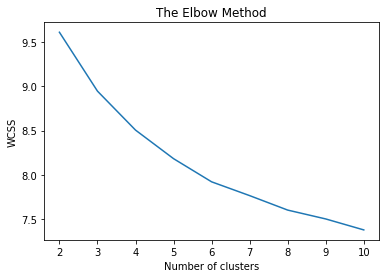

In [100]:
plt.plot(range(2, 11), kmeans_wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.savefig('kmeans-clusters-elbow.png', dpi=300)
plt.show()

#### The Silhouette Score plot

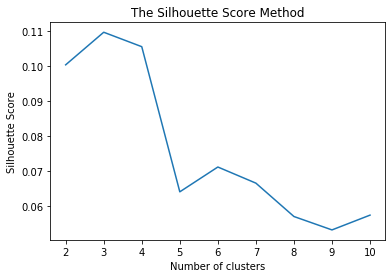

In [101]:
plt.plot(range(2, 11), kmeans_silhouette)
plt.title('The Silhouette Score Method')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.savefig('kmeans-clusters-silhouette.png', dpi=300)
plt.show()

#### Let's run the k-means clustering algorithm

In [102]:
# set number of optimal clusters
kclusters = 5
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(combined_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 2, 4, 4, 4, 4, 3, 4, 4, 4])

In [103]:
# Create a new dataframe that contains the cluster and the top 10 venue categories
# add clustering labels
combined_neighborhoods_categories_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

combined_merged = combined_neighborhoods

# merge combined_neighborhoods_venues_sorted with combined_neighborhoods to add latitude/longitude for each neighborhood
combined_merged = combined_merged.join(combined_neighborhoods_categories_sorted.set_index('Neighborhood'), on='Neighborhood')
#combined_merged = combined_merged.set_index('Neighborhood')

combined_merged.head() # check the last columns!

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
0,Bronx,NYC_Wakefield,40.894705,-73.847201,2,Salon / Barbershop,Laundry Service,Church,Doctor's Office,Gas Station,Coworking Space,Convenience Store,Deli / Bodega,Food,School
1,Bronx,NYC_Co-op City,40.874294,-73.829939,4,Bus Line,Residential Building (Apartment / Condo),School,Bus Station,Church,Parking,Salon / Barbershop,Other Great Outdoors,Bus Stop,Dentist's Office
2,Bronx,NYC_Eastchester,40.887556,-73.827806,4,Automotive Shop,Bus Line,Auto Dealership,Caribbean Restaurant,Bus Station,Deli / Bodega,Gas Station,Factory,Fast Food Restaurant,Church
3,Bronx,NYC_Fieldston,40.895437,-73.905643,4,Synagogue,College Administrative Building,College Residence Hall,Residential Building (Apartment / Condo),Church,College Quad,Cosmetics Shop,School,High School,Park
4,Bronx,NYC_Riverdale,40.890834,-73.912585,3,Residential Building (Apartment / Condo),Synagogue,Doctor's Office,Park,Playground,Pool,General College & University,Beach Bar,School,Bus Station


In [104]:
combined_merged = combined_merged.reset_index()

In [105]:
combined_merged.shape

(409, 16)

In [106]:
combined_merged.to_csv("combined_merged.csv")

In [107]:
combined_merged

,index,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
0,0,Bronx,NYC_Wakefield,40.894705,-73.847201,2,Salon / Barbershop,Laundry Service,Church,Doctor's Office,Gas Station,Coworking Space,Convenience Store,Deli / Bodega,Food,School
1,1,Bronx,NYC_Co-op City,40.874294,-73.829939,4,Bus Line,Residential Building (Apartment / Condo),School,Bus Station,Church,Parking,Salon / Barbershop,Other Great Outdoors,Bus Stop,Dentist's Office
2,2,Bronx,NYC_Eastchester,40.887556,-73.827806,4,Automotive Shop,Bus Line,Auto Dealership,Caribbean Restaurant,Bus Station,Deli / Bodega,Gas Station,Factory,Fast Food Restaurant,Church
3,3,Bronx,NYC_Fieldston,40.895437,-73.905643,4,Synagogue,College Administrative Building,College Residence Hall,Residential Building (Apartment / Condo),Church,College Quad,Cosmetics Shop,School,High School,Park
4,4,Bronx,NYC_Riverdale,40.890834,-73.912585,3,Residential Building (Apartment / Condo),Synagogue,Doctor's Office,Park,Playground,Pool,General College & University,Beach Bar,School,Bus Station
5,5,Bronx,NYC_Kingsbridge,40.881687,-73.902818,2,Laundry Service,Salon / Barbershop,Boutique,Miscellaneous Shop,Bank,Shipping Store,Pet Store,College Bookstore,Gym / Fitness Center,Discount Store
6,6,Manhattan,NYC_Marble Hill,40.876551,-73.910660,2,Deli / Bodega,Salon / Barbershop,High School,Laundry Service,Church,Residential Building (Apartment / Condo),Furniture / Home Store,Nail Salon,Mexican Restaurant,Office
7,7,Bronx,NYC_Woodlawn,40.898273,-73.867315,2,Bar,Deli / Bodega,Salon / Barbershop,Food & Drink Shop,Office,Pizza Place,Church,Pub,Food,Gas Station
8,8,Bronx,NYC_Norwood,40.877224,-73.879391,0,Doctor's Office,Park,Residential Building (Apartment / Condo),Medical Center,Deli / Bodega,Salon / Barbershop,Laundry Service,School,Food Truck,Library
9,9,Bronx,NYC_Williamsbridge,40.881039,-73.857446,2,Church,Salon / Barbershop,Caribbean Restaurant,Deli / Bodega,Spa,School,Hardware Store,Nail Salon,Nightclub,Bowling Alley


#### Finally, let's visualize the resulting clusters

In [108]:
# create map
map_clusters_nyc = folium.Map(location=[nyc_latitude, nyc_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(combined_merged['Latitude'], combined_merged['Longitude'], combined_merged['Neighborhood'], combined_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_nyc)
       
map_clusters_nyc

In [109]:
map_clusters_nyc.save("nyc_neighborhoods_clustered.html")

In [110]:
# create map
map_clusters_tor = folium.Map(location=[tor_latitude, tor_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(combined_merged['Latitude'], combined_merged['Longitude'], combined_merged['Neighborhood'], combined_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_tor)
       
map_clusters_tor

In [111]:
map_clusters_tor.save("tor_neighborhoods_clustered.html")

#### Examine Clusters

In [112]:
combined_merged['Cluster Labels'].value_counts()

4    201
2     78
3     56
0     39
1     35
Name: Cluster Labels, dtype: int64

In [113]:
combined_merged = combined_merged.set_index('Neighborhood')

In [114]:
combined_merged.head()

,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Wakefield,0,Bronx,40.894705,-73.847201,2,Salon / Barbershop,Laundry Service,Church,Doctor's Office,Gas Station,Coworking Space,Convenience Store,Deli / Bodega,Food,School
NYC_Co-op City,1,Bronx,40.874294,-73.829939,4,Bus Line,Residential Building (Apartment / Condo),School,Bus Station,Church,Parking,Salon / Barbershop,Other Great Outdoors,Bus Stop,Dentist's Office
NYC_Eastchester,2,Bronx,40.887556,-73.827806,4,Automotive Shop,Bus Line,Auto Dealership,Caribbean Restaurant,Bus Station,Deli / Bodega,Gas Station,Factory,Fast Food Restaurant,Church
NYC_Fieldston,3,Bronx,40.895437,-73.905643,4,Synagogue,College Administrative Building,College Residence Hall,Residential Building (Apartment / Condo),Church,College Quad,Cosmetics Shop,School,High School,Park
NYC_Riverdale,4,Bronx,40.890834,-73.912585,3,Residential Building (Apartment / Condo),Synagogue,Doctor's Office,Park,Playground,Pool,General College & University,Beach Bar,School,Bus Station


#### Cluster 1

In [115]:
cls1 = combined_merged.loc[combined_merged['Cluster Labels'] == 0, :]
print(cls1.shape)
cls1

(39, 15)


,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Norwood,8,Bronx,40.877224,-73.879391,0,Doctor's Office,Park,Residential Building (Apartment / Condo),Medical Center,Deli / Bodega,Salon / Barbershop,Laundry Service,School,Food Truck,Library
NYC_Pelham Parkway,11,Bronx,40.857413,-73.854756,0,Doctor's Office,Office,Deli / Bodega,Residential Building (Apartment / Condo),Dentist's Office,Diner,Café,Salon / Barbershop,Bus Station,Pizza Place
NYC_Morris Park,33,Bronx,40.847549,-73.850402,0,Doctor's Office,Bus Station,Laundry Service,Residential Building (Apartment / Condo),Salon / Barbershop,Deli / Bodega,Dentist's Office,Ice Cream Shop,Park,Bus Line
NYC_Schuylerville,38,Bronx,40.826580,-73.826203,0,Doctor's Office,Salon / Barbershop,Deli / Bodega,Professional & Other Places,Pharmacy,Pizza Place,Mental Health Office,Office,Pet Service,Skate Park
NYC_Pelham Gardens,42,Bronx,40.862966,-73.841612,0,Doctor's Office,Dentist's Office,Office,Other Great Outdoors,Playground,Pizza Place,Pharmacy,Medical Center,Gas Station,Spanish Restaurant
NYC_Manhattan Terrace,53,Brooklyn,40.614433,-73.957438,0,Doctor's Office,Residential Building (Apartment / Condo),Dentist's Office,Housing Development,Parking,School,Medical Center,Chinese Restaurant,Synagogue,Deli / Bodega
NYC_Brooklyn Heights,64,Brooklyn,40.695864,-73.993782,0,Doctor's Office,Residential Building (Apartment / Condo),Women's Store,Church,Salon / Barbershop,Laundry Service,School,Hot Dog Joint,Health & Beauty Service,Boat or Ferry
NYC_Starrett City,73,Brooklyn,40.647589,-73.879370,0,Doctor's Office,Bus Stop,Laundry Service,Residential Building (Apartment / Condo),Parking,Pharmacy,Gym / Fitness Center,Salon / Barbershop,College Academic Building,School
NYC_Dyker Heights,81,Brooklyn,40.619219,-74.019314,0,Doctor's Office,Gas Station,Salon / Barbershop,Deli / Bodega,Dog Run,Bus Line,Event Space,Automotive Shop,Pet Store,Fried Chicken Joint


#### Cluster 2

In [116]:
cls2 = combined_merged.loc[combined_merged['Cluster Labels'] == 1, :]
print(cls2.shape)
cls2

(35, 15)


,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Gowanus,68,Brooklyn,40.673931,-73.994441,1,Office,Art Gallery,Design Studio,Coworking Space,Factory,Metro Station,Tech Startup,General Entertainment,Parking,Bridge
NYC_Midtown,114,Manhattan,40.754691,-73.981669,1,Office,General College & University,College Administrative Building,Shoe Store,American Restaurant,General Entertainment,Post Office,Bank,Dance Studio,Tech Startup
NYC_Little Italy,121,Manhattan,40.719324,-73.997305,1,Italian Restaurant,Office,Salon / Barbershop,Smoke Shop,Gift Shop,Gourmet Shop,Other Nightlife,Miscellaneous Shop,Lounge,Bakery
NYC_Soho,122,Manhattan,40.722184,-74.000657,1,Office,Boutique,Clothing Store,Women's Store,Jewelry Store,Men's Store,Residential Building (Apartment / Condo),Music Venue,Furniture / Home Store,Event Space
NYC_Financial District,128,Manhattan,40.707107,-74.010665,1,Office,Food Truck,Bar,IT Services,Event Space,Doctor's Office,Financial or Legal Service,Conference Room,Food Court,Pet Service
NYC_Bloomfield,245,Staten Island,40.605779,-74.187256,1,Office,Doctor's Office,Automotive Shop,Grocery Store,Sporting Goods Shop,Baseball Field,Other Great Outdoors,Cosmetics Shop,Coworking Space,Business Center
NYC_Civic Center,249,Manhattan,40.715229,-74.005415,1,Office,Lawyer,Government Building,Doctor's Office,Coworking Space,Tech Startup,Residential Building (Apartment / Condo),Dance Studio,Gym,Convenience Store
NYC_Midtown South,250,Manhattan,40.748510,-73.988713,1,Office,Spa,Food Stand,American Restaurant,Hotel,Jewelry Store,Event Space,Doctor's Office,Metro Station,Residential Building (Apartment / Condo)
NYC_Turtle Bay,273,Manhattan,40.752042,-73.967708,1,Office,Government Building,Embassy / Consulate,Residential Building (Apartment / Condo),Monument / Landmark,Non-Profit,Tunnel,Garden,Doctor's Office,Meeting Room


#### Cluster 3

In [117]:
cls3 = combined_merged.loc[combined_merged['Cluster Labels'] == 2, :]
print(cls3.shape)
cls3

(78, 15)


,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Wakefield,0,Bronx,40.894705,-73.847201,2,Salon / Barbershop,Laundry Service,Church,Doctor's Office,Gas Station,Coworking Space,Convenience Store,Deli / Bodega,Food,School
NYC_Kingsbridge,5,Bronx,40.881687,-73.902818,2,Laundry Service,Salon / Barbershop,Boutique,Miscellaneous Shop,Bank,Shipping Store,Pet Store,College Bookstore,Gym / Fitness Center,Discount Store
NYC_Marble Hill,6,Manhattan,40.876551,-73.910660,2,Deli / Bodega,Salon / Barbershop,High School,Laundry Service,Church,Residential Building (Apartment / Condo),Furniture / Home Store,Nail Salon,Mexican Restaurant,Office
NYC_Woodlawn,7,Bronx,40.898273,-73.867315,2,Bar,Deli / Bodega,Salon / Barbershop,Food & Drink Shop,Office,Pizza Place,Church,Pub,Food,Gas Station
NYC_Williamsbridge,9,Bronx,40.881039,-73.857446,2,Church,Salon / Barbershop,Caribbean Restaurant,Deli / Bodega,Spa,School,Hardware Store,Nail Salon,Nightclub,Bowling Alley
NYC_University Heights,14,Bronx,40.855727,-73.910416,2,College Academic Building,Salon / Barbershop,Deli / Bodega,Supermarket,Bar,College Gym,Discount Store,Emergency Room,College Administrative Building,Residential Building (Apartment / Condo)
NYC_East Tremont,17,Bronx,40.842696,-73.887356,2,Salon / Barbershop,Cosmetics Shop,Food,Church,Dentist's Office,Shoe Store,Nail Salon,Bus Line,Department Store,Residential Building (Apartment / Condo)
NYC_High Bridge,19,Bronx,40.836623,-73.926102,2,Salon / Barbershop,Residential Building (Apartment / Condo),Deli / Bodega,Pharmacy,Laundry Service,Chinese Restaurant,Bus Line,Doctor's Office,Playground,Grocery Store
NYC_Soundview,26,Bronx,40.821012,-73.865746,2,Residential Building (Apartment / Condo),Housing Development,Laundry Service,Salon / Barbershop,Deli / Bodega,Bus Line,Pizza Place,Grocery Store,Liquor Store,School


#### Cluster 4

In [118]:
cls4 = combined_merged.loc[combined_merged['Cluster Labels'] == 3, :]
print(cls4.shape)
cls4

(56, 15)


,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Riverdale,4,Bronx,40.890834,-73.912585,3,Residential Building (Apartment / Condo),Synagogue,Doctor's Office,Park,Playground,Pool,General College & University,Beach Bar,School,Bus Station
NYC_Bedford Park,13,Bronx,40.870185,-73.885512,3,Residential Building (Apartment / Condo),Deli / Bodega,Bus Line,Church,Salon / Barbershop,Bus Station,School,Park,Medical Center,Fruit & Vegetable Store
NYC_Morris Heights,15,Bronx,40.847898,-73.919672,3,Residential Building (Apartment / Condo),Grocery Store,Bus Line,Church,Convenience Store,Spanish Restaurant,Deli / Bodega,Salon / Barbershop,Supermarket,Chinese Restaurant
NYC_Melrose,20,Bronx,40.819754,-73.909422,3,Residential Building (Apartment / Condo),Laundry Service,Doctor's Office,Salon / Barbershop,High School,Office,Housing Development,Deli / Bodega,Grocery Store,Garden
NYC_Mott Haven,21,Bronx,40.806239,-73.916100,3,Residential Building (Apartment / Condo),Salon / Barbershop,Chinese Restaurant,Grocery Store,Church,Pharmacy,Asian Restaurant,Restaurant,Pizza Place,Elementary School
NYC_Spuyten Duyvil,35,Bronx,40.881395,-73.917190,3,Residential Building (Apartment / Condo),Doctor's Office,Bus Line,Medical Center,Dentist's Office,Salon / Barbershop,Nursery School,Park,American Restaurant,Laundry Service
NYC_Flatbush,54,Brooklyn,40.636326,-73.958401,3,Residential Building (Apartment / Condo),Salon / Barbershop,Deli / Bodega,Bus Station,School,Bank,Lounge,Mexican Restaurant,Gym,Laundry Service
NYC_Prospect Heights,59,Brooklyn,40.676822,-73.964859,3,Residential Building (Apartment / Condo),Deli / Bodega,Salon / Barbershop,Thai Restaurant,Mexican Restaurant,Doctor's Office,Brewery,Rental Car Location,General Entertainment,Cocktail Bar
NYC_Cobble Hill,65,Brooklyn,40.687920,-73.998561,3,Residential Building (Apartment / Condo),Other Great Outdoors,Office,Medical Center,Playground,Chinese Restaurant,Garden,Event Space,Church,Bus Line


#### Cluster 5

In [119]:
cls5 = combined_merged.loc[combined_merged['Cluster Labels'] == 4, :]
print(cls5.shape)
cls5

(201, 15)


,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Co-op City,1,Bronx,40.874294,-73.829939,4,Bus Line,Residential Building (Apartment / Condo),School,Bus Station,Church,Parking,Salon / Barbershop,Other Great Outdoors,Bus Stop,Dentist's Office
NYC_Eastchester,2,Bronx,40.887556,-73.827806,4,Automotive Shop,Bus Line,Auto Dealership,Caribbean Restaurant,Bus Station,Deli / Bodega,Gas Station,Factory,Fast Food Restaurant,Church
NYC_Fieldston,3,Bronx,40.895437,-73.905643,4,Synagogue,College Administrative Building,College Residence Hall,Residential Building (Apartment / Condo),Church,College Quad,Cosmetics Shop,School,High School,Park
NYC_Baychester,10,Bronx,40.866858,-73.835798,4,Gas Station,Bank,Bus Line,Donut Shop,Chinese Restaurant,Middle School,Bus Station,Garden,Automotive Shop,Sandwich Place
NYC_City Island,12,Bronx,40.847247,-73.786488,4,Harbor / Marina,Bus Station,Antique Shop,Café,Sporting Goods Shop,Miscellaneous Shop,Office,Residential Building (Apartment / Condo),Beach,Thrift / Vintage Store
NYC_Fordham,16,Bronx,40.860997,-73.896427,4,Clothing Store,Doctor's Office,Bus Station,Deli / Bodega,Government Building,Women's Store,Bank,Bus Line,Nail Salon,Bakery
NYC_West Farms,18,Bronx,40.839475,-73.877745,4,Automotive Shop,Residential Building (Apartment / Condo),Bus Station,Bus Stop,Doctor's Office,Bus Line,School,Housing Development,Sandwich Place,Pharmacy
NYC_Port Morris,22,Bronx,40.801664,-73.913221,4,Factory,Office,Government Building,Residential Building (Apartment / Condo),Bar,Storage Facility,Latin American Restaurant,Event Space,Warehouse,Food Truck
NYC_Longwood,23,Bronx,40.815099,-73.895788,4,Automotive Shop,Pizza Place,Mexican Restaurant,Church,Salon / Barbershop,Gas Station,Food,Bus Station,Office,Chinese Restaurant


In [120]:
combined_merged.head()

,index,Borough,Latitude,Longitude,Cluster Labels,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
Neighborhood,,,,,,,,,,,,,,,
NYC_Wakefield,0,Bronx,40.894705,-73.847201,2,Salon / Barbershop,Laundry Service,Church,Doctor's Office,Gas Station,Coworking Space,Convenience Store,Deli / Bodega,Food,School
NYC_Co-op City,1,Bronx,40.874294,-73.829939,4,Bus Line,Residential Building (Apartment / Condo),School,Bus Station,Church,Parking,Salon / Barbershop,Other Great Outdoors,Bus Stop,Dentist's Office
NYC_Eastchester,2,Bronx,40.887556,-73.827806,4,Automotive Shop,Bus Line,Auto Dealership,Caribbean Restaurant,Bus Station,Deli / Bodega,Gas Station,Factory,Fast Food Restaurant,Church
NYC_Fieldston,3,Bronx,40.895437,-73.905643,4,Synagogue,College Administrative Building,College Residence Hall,Residential Building (Apartment / Condo),Church,College Quad,Cosmetics Shop,School,High School,Park
NYC_Riverdale,4,Bronx,40.890834,-73.912585,3,Residential Building (Apartment / Condo),Synagogue,Doctor's Office,Park,Playground,Pool,General College & University,Beach Bar,School,Bus Station


In [121]:
combined_neighborhoods_categories_sorted.head()

,Cluster Labels,Neighborhood,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category
0,2,NYC_Allerton,Salon / Barbershop,Laundry Service,Bus Line,Car Wash,Non-Profit,Gas Station,Automotive Shop,Pharmacy,Pizza Place,Deli / Bodega
1,2,NYC_Annadale,Salon / Barbershop,Pizza Place,Tattoo Parlor,Nail Salon,American Restaurant,Restaurant,Bar,Doctor's Office,General Entertainment,Pet Store
2,4,NYC_Arden Heights,Pool,Professional & Other Places,Church,Dentist's Office,Doctor's Office,Moving Target,Salon / Barbershop,Medical Center,Cocktail Bar,Mexican Restaurant
3,4,NYC_Arlington,Church,Bus Stop,Professional & Other Places,Residential Building (Apartment / Condo),Hardware Store,Office,Salon / Barbershop,Laundry Service,Playground,Deli / Bodega
4,4,NYC_Arrochar,Deli / Bodega,Bus Stop,Bus Line,Food Truck,Doctor's Office,Pizza Place,Medical Center,Event Space,Office,Nail Salon


In [122]:
combined_merged_new = combined_neighborhoods_categories_sorted.copy()
combined_merged_new['City'] = combined_merged_new['Neighborhood'].str[:3]
combined_merged_new['City'] = combined_merged_new['City'].map({'NYC': 'New York City', 'YYZ': 'Toronto'})
combined_merged_new.head()

,Cluster Labels,Neighborhood,1st Most Common Category,2nd Most Common Category,3rd Most Common Category,4th Most Common Category,5th Most Common Category,6th Most Common Category,7th Most Common Category,8th Most Common Category,9th Most Common Category,10th Most Common Category,City
0,2,NYC_Allerton,Salon / Barbershop,Laundry Service,Bus Line,Car Wash,Non-Profit,Gas Station,Automotive Shop,Pharmacy,Pizza Place,Deli / Bodega,New York City
1,2,NYC_Annadale,Salon / Barbershop,Pizza Place,Tattoo Parlor,Nail Salon,American Restaurant,Restaurant,Bar,Doctor's Office,General Entertainment,Pet Store,New York City
2,4,NYC_Arden Heights,Pool,Professional & Other Places,Church,Dentist's Office,Doctor's Office,Moving Target,Salon / Barbershop,Medical Center,Cocktail Bar,Mexican Restaurant,New York City
3,4,NYC_Arlington,Church,Bus Stop,Professional & Other Places,Residential Building (Apartment / Condo),Hardware Store,Office,Salon / Barbershop,Laundry Service,Playground,Deli / Bodega,New York City
4,4,NYC_Arrochar,Deli / Bodega,Bus Stop,Bus Line,Food Truck,Doctor's Office,Pizza Place,Medical Center,Event Space,Office,Nail Salon,New York City


In [123]:
combined_merged_new.groupby(['Cluster Labels', 'City']).count()

Neighborhood  1st Most Common Category  \
Cluster Labels City                                                    
0              New York City            39                        39   
1              New York City            13                        13   
               Toronto                  22                        22   
2              New York City            74                        74   
               Toronto                   4                         4   
3              New York City            39                        39   
               Toronto                  17                        17   
4              New York City           141                       141   
               Toronto                  60                        60   

                              2nd Most Common Category  \
Cluster Labels City                                      
0              New York City                        39   
1              New York City                        13   
               Toronto                              22   
2              New York City                        74   
               Toronto                               4   
3              New York City                        39   
               Toronto                              17   
4              New York City                       141   
               Toronto                              60   

                              3rd Most Common Category  \
Cluster Labels City                                      
0              New York City                        39   
1              New York City                        13   
               Toronto                              22   
2              New York City                        74   
               Toronto                               4   
3              New York City                        39   
               Toronto                              17   
4              New York City                       141   
               Toronto                              60   

                              4th Most Common Category  \
Cluster Labels City                                      
0              New York City                        39   
1              New York City                        13   
               Toronto                              22   
2              New York City                        74   
               Toronto                               4   
3              New York City                        39   
               Toronto                              17   
4              New York City                       141   
               Toronto                              60   

                              5th Most Common Category  \
Cluster Labels City                                      
0              New York City                        39   
1              New York City                        13   
               Toronto                              22   
2              New York City                        74   
               Toronto                               4   
3              New York City                        39   
               Toronto                              17   
4              New York City                       141   
               Toronto                              60   

                              6th Most Common Category  \
Cluster Labels City                                      
0              New York City                        39   
1              New York City                        13   
               Toronto                              22   
2              New York City                        74   
               Toronto                               4   
3              New York City                        39   
               Toronto                              17   
4              New York City                       141   
               Toronto                              60   

                              7th Most Com

In [124]:
combined_merged['Cluster Labels'].value_counts()

4    201
2     78
3     56
0     39
1     35
Name: Cluster Labels, dtype: int64

In [125]:
clus_plot_data = combined_merged_new.groupby(['Cluster Labels', 'City']).size()
clus_plot_data.columns = ['Cluster', 'City', 'Count of Neighborhoods']
clus_plot_data

Cluster Labels  City         
0               New York City     39
1               New York City     13
                Toronto           22
2               New York City     74
                Toronto            4
3               New York City     39
                Toronto           17
4               New York City    141
                Toronto           60
dtype: int64

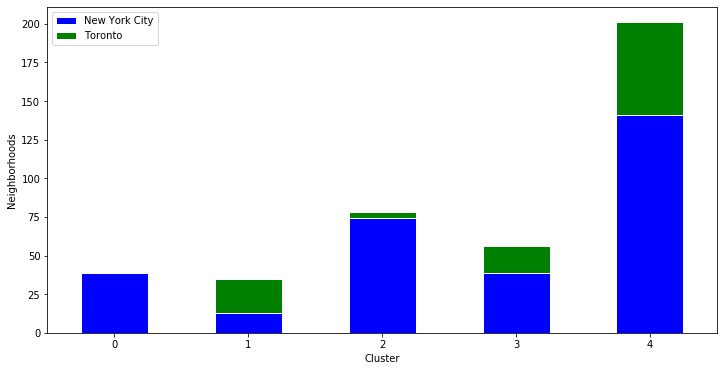

In [126]:
cls_data = combined_merged_new.groupby(['Cluster Labels', 'City']).count().unstack()
fig, ax = plt.subplots(figsize=(12,6))
ax = cls_data.plot(y='Neighborhood', ax=ax, kind='bar', stacked=True, color=['blue','green'], edgecolor='white')
ax.tick_params(axis='x', labelrotation=0)
ax.legend(title='')
ax.set_xlabel('Cluster')
ax.set_ylabel('Neighborhoods')
fig.savefig('cluster-city-counts.png', dpi=300)
plt.show()

In [127]:
clust_cats = []
clusters = [cls1, cls2, cls3, cls4, cls5]
for i, clus in enumerate(clusters):
    clust_cats.append([])
    for n in clus.index.values:
        if n.startswith('NYC_'):
            clust_cats[i].extend(list(nyc_venues[nyc_venues['Neighborhood'] == n]['Venue Category'].values))
        else:
            clust_cats[i].extend(list(toronto_venues[toronto_venues['Neighborhood'] == n]['Venue Category'].values))
    clust_cats[i] = pd.Series(clust_cats[i]).value_counts(normalize=True) * 100

In [128]:
clust_cats[0].head(10)

Doctor's Office                             13.113695
Residential Building (Apartment / Condo)     4.748062
Dentist's Office                             3.779070
Office                                       3.068475
Medical Center                               2.680879
Salon / Barbershop                           2.616279
Deli / Bodega                                2.357881
Bus Line                                     2.164083
Laundry Service                              1.647287
Bus Stop                                     1.518088
dtype: float64

In [129]:
clust_cats[1].head(10)

Office                                      15.815486
Doctor's Office                              2.009885
Tech Startup                                 2.009885
Coworking Space                              1.878089
Residential Building (Apartment / Condo)     1.878089
Coffee Shop                                  1.647446
Automotive Shop                              1.614498
Government Building                          1.285008
Café                                         1.252059
Gym                                          1.252059
dtype: float64

In [130]:
clust_cats[2].head(10)

Salon / Barbershop                          8.503961
Deli / Bodega                               3.900762
Residential Building (Apartment / Condo)    2.660290
Church                                      2.510835
Bus Line                                    2.465999
Laundry Service                             2.436108
Doctor's Office                             2.196981
Pizza Place                                 2.032581
Chinese Restaurant                          2.002690
Nail Salon                                  1.808399
dtype: float64

In [131]:
clust_cats[3].head(10)

Residential Building (Apartment / Condo)    14.517189
Salon / Barbershop                           3.109262
Doctor's Office                              2.912196
Office                                       2.758923
Laundry Service                              2.255310
Deli / Bodega                                2.123933
Church                                       1.839282
Park                                         1.642216
Dentist's Office                             1.642216
Bus Line                                     1.335669
dtype: float64

In [132]:
clust_cats[4].head(10)

Office                                      2.927847
Residential Building (Apartment / Condo)    2.605844
Salon / Barbershop                          2.391175
Automotive Shop                             2.134764
Deli / Bodega                               1.967800
Church                                      1.920095
Pizza Place                                 1.747168
Bus Line                                    1.717352
Doctor's Office                             1.669648
Bus Stop                                    1.443053
dtype: float64

<br><br><br><a id='item6'></a>

## 6 Results and Discussion

Our analysis of **Most Common Venue Categories** of the two cities shows that New York City has Residential as the topmost common venue category overall while Toronto has Office as the topmost common venue category. In New York City, Salon / Barbershop, Doctor's Office, Office and Deli / Bodega are the other categories in top 5 common while Toronto has Residential, Salon / Barbershop, Park and Church in top 5 common.<br><br>
Our analysis of **Most Widespread Venue Categories** (that exist in most neighborhoods) shows that New York City has Salon / Barbershop as the most widespread venue category while Toronto has Office as the most widespread venue category. In New York City, Deli / Bodega, Office, Residential & Doctor's Office are the other widespread categories in top 5 widespread while Toronto has Salon / Barbershop, Residential, Coffee Shop and Doctor's Office in top 5 widespread.<br><br>
Some **interesting observations** based on the above:
<br>In New York City, Residential is the Most Common Venue Category but it is only the 4th Most Widespread Venue Category which means that this venue category is highly concentrated in some of the 306 neighborhoods.
<br>In Toronto, Residential is the Most Common Venue Category and it is also the Most Widespread Venue Category which means that this venue category is highly concentrated in most of the 103 neighborhoods.<br><br>
The **highlights of the analysis of the 5 clusters** are explained below.
<br><br>There are **3 clusters which have similar neighborhoods** from both New York City and Toronto. 
<br><br>***“Neighborhoods with balanced Residential and Business presence”***
<br>New York City = 141 & Toronto = 60
<br><br>***“Neighborhoods that are Business and Commercial Centers”***
<br>New York City = 13 & Toronto = 22
<br><br>***“Neighborhoods that are densely Residential with good access to services”***
<br>New York City = 39 & Toronto = 17<br><br>
There are **2 clusters which have neighborhoods that are quite distinct** in New York City. 
<br><br>***“Neighborhoods around Medical Facilities”***
<br>New York City = 39 & Toronto = 0
<br><br>***“Neighborhoods that are sparsely Residential with above average access to services”***
<br>New York City = 74 & Toronto = 4


<br><br><br><a id='item7'></a>

## 7 Conclusion

Specifically, we wanted to find out answers to questions such as:
<br><br>**What are the most common venue categories in each city?**
<br>*New York City has Residential as the topmost common venue category overall while Toronto has Office as the topmost common venue category. In New York City, Salon / Barbershop, Doctor's Office, Office and Deli / Bodega are the other categories in top 5 while Toronto has Residential, Salon / Barbershop, Park and Church in top 5*
<br><br>**What venue categories are most widespread in each city?**
<br>*New York City has Salon / Barbershop as the most widespread venue category while Toronto has Office as the most widespread venue category. In New York City, Deli / Bodega, Office, Pizza Place & Doctor's Office are the other widespread categories in top 5 widespread while Toronto has Salon / Barbershop, Residential, Coffee Shop and Doctor's Office in top 5 widespread*
<br><br>**How many neighborhoods of these two cities are similar to each other?**
<br>&nbsp;&nbsp;&nbsp;*There are 3 sets of neighborhoods of these two cities that are very similar to each other<br>
<br>&nbsp;&nbsp;&nbsp;**Neighborhoods with balanced Residential and Business presence”**
<br>&nbsp;&nbsp;&nbsp;New York City = 141 & Toronto = 60
<br>&nbsp;&nbsp;&nbsp;**“Neighborhoods that are Business and Commercial Centers”**
<br>&nbsp;&nbsp;&nbsp;New York City = 13 & Toronto = 22
<br>&nbsp;&nbsp;&nbsp;**“Neighborhoods that are densely Residential with good access to services”**
<br>&nbsp;&nbsp;&nbsp;New York City = 39 & Toronto = 17*
<br><br>**How many neighborhoods of these two cities are quite unique to themselves?**
<br>&nbsp;&nbsp;&nbsp;*There are 2 sets of neighborhoods of these two cities that are very unique to themselves and all but one of them are in New York City<br>
<br>&nbsp;&nbsp;&nbsp;**“Neighborhoods around Medical Facilities”**
<br>&nbsp;&nbsp;&nbsp;New York City = 39 & Toronto = 0
<br>&nbsp;&nbsp;&nbsp;**“Neighborhoods that are sparsely Residential with above average access to services”**
<br>&nbsp;&nbsp;&nbsp;New York City = 74 & Toronto = 4*
<br><br>**Are these two cities very similar to each other or very different?**
<br>*The fact that 3 out of the 5 clusters have a significant number of each city’s neighborhoods (~ 63% of New York City & ~ 96% of Toronto) in the similar cluster buckets indicates that these two cities are very similar to each other.
<br>There are 2 sets of neighborhoods almost all in New York City (they represent ~ 37% of the neighborhoods of that city) that are quite unique to themselves and have insignificant (~ 4%) similar neighborhoods in Toronto.*


In [133]:
print('All Done!')

All Done!
